In [1]:
%load_ext autoreload
%autoreload 2

import os
import sys
sys.path.append("../")

import pyaldata as pyal
import pandas as pd
import numpy as np


# from tools.reports.report_initial import run_initial_report
from tools import dataTools as dt
import pickle
import pathlib  
import numpy as np
import matplotlib.pyplot as plt
from sklearn.naive_bayes import GaussianNB
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
import pyaldata as pyal
from tools.viz import mean_firing as firing
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from tools.params import Params
from tools.decoding import decodeTools as decode
from tools.dsp.preprocessing import preprocess
from tools.params import colors
from tools import dataTools as dt
import torch
from tools.viz import utilityTools as utility
# import sem from scipy.stats
from scipy.stats import sem
from tools import params
from tqdm import tqdm
from sklearn.model_selection import cross_val_score

In [2]:
sessions = [
    # 'M062_2025_03_19_14_00',
    # 'M062_2025_03_20_14_00',
    'M062_2025_03_21_14_00',
    # 'M061_2025_03_04_10_00',
    # 'M061_2025_03_05_14_00',
    # "M061_2025_03_06_14_00",
    # "M063_2025_03_12_14_00",  
    # "M063_2025_03_13_14_00",  
    # "M063_2025_03_14_15_30",
    # "M078_2025_08_05_15_30",
    # "M078_2025_08_06_15_00",
    # "M078_2025_08_07_13_30",
    # "M078_2025_08_08_10_30",# muscimol session
   
    # # "M066_2025_04_09_15_45" # bci session
    # "M103_2026_02_17_14_00", # control session
    # "M103_2026_02_17_14_00",# control session
    # "M103_2026_02_18_15_30",
    # "M103_2026_02_19_15_30",
    # "M103_2026_02_20_16_00",# muscimol session
    # "M106_2026_02_24_15_00",# control session
    # "M106_2026_02_25_15_00",
    # "M106_2026_02_26_16_00",
    # "M106_2026_02_27_16_00",# muscimol session
    # "M081_2026_01_28_16_00",
    # "M086_2025_12_09_16_00",
    # "M086_2025_12_10_15_00",
    # "M086_2025_12_11_15_00"
    
]




In [3]:
df = dt.load_sessions(sessions, prep = False)[0]

M062_2025_03_21_14_00
fields: ['values_before_camera_trigger', 'idx_before_camera_trigger'] could not be converted to int.
fields: ['values_Sol_direction', 'idx_Sol_direction', 'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on'] could not be converted to int.
fields: ['values_Sol_direction', 'idx_Sol_direction', 'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on'] could not be converted to int.


In [4]:
bin_size  = 0.2
time_signals = [
        signal for signal in pyal.get_time_varying_fields(df) if "spikes" in signal
    ]

    # Remove low firing neurons
for signal in time_signals:
    if signal.split("_")[0]+"_kslabel" in df.columns:
        # change column name to KSLabel to match firing_rates.py
        df = df.rename(columns={signal.split("_")[0]+"_kslabel": signal.split("_")[0]+"_KSLabel"})
    df = pyal.remove_low_firing_neurons(df, signal, 1)
df = pyal.combine_time_bins(df, int(bin_size / 0.01))



/data/pyaldata/pyaldata/utils.py:155: UserWarning: values_MotSen1_X might be a time-varying field. It matches the length of VAL_spikes on 99.85875706214689% of trials
  warnings.warn(
/data/pyaldata/pyaldata/utils.py:155: UserWarning: idx_MotSen1_X might be a time-varying field. It matches the length of VAL_spikes on 99.85875706214689% of trials
  warnings.warn(
/data/pyaldata/pyaldata/utils.py:155: UserWarning: values_MotSen1_Y might be a time-varying field. It matches the length of VAL_spikes on 99.85875706214689% of trials
  warnings.warn(
/data/pyaldata/pyaldata/utils.py:155: UserWarning: idx_MotSen1_Y might be a time-varying field. It matches the length of VAL_spikes on 99.85875706214689% of trials
  warnings.warn(
/data/pyaldata/pyaldata/utils.py:155: UserWarning: values_MotSen1_X might be a time-varying field. It matches the length of VAL_spikes on 99.85875706214689% of trials
  warnings.warn(
/data/pyaldata/pyaldata/utils.py:155: UserWarning: idx_MotSen1_X might be a time-varyi

In [64]:
area = "VAL"
field = f"{area}_spikes"
data = np.concatenate(df[field].values, axis = 0).astype(np.float32, copy=False).T

In [65]:
import numpy as np
import matplotlib.pyplot as plt
# importing rastermap
# (this will be slow the first time since it is compiling the numba functions)
from rastermap import Rastermap, utils
from scipy.stats import zscore

n_neurons, n_time = data.shape
print(f"{n_neurons} neurons by {n_time} timepoints")
# zscore activity (each neuron activity trace is then mean 0 and standard-deviation 1)
spks = zscore(data, axis=1)


122 neurons by 20699 timepoints


In [66]:
model = Rastermap(n_clusters=100, # None turns off clustering and sorts single neurons 
                  n_PCs=60, # use fewer PCs than neurons
                  locality=0.1, # some locality in sorting (this is a value from 0-1)
                  time_lag_window=10, # use future timepoints to compute correlation
                  grid_upsample=0, # 0 turns off upsampling since we're using single neurons
                ).fit(spks)
y = model.embedding # neurons x 1
isort = model.isort

2026-05-06 22:48:17,054 [INFO] normalizing data across axis=1
2026-05-06 22:48:17,061 [INFO] projecting out mean along axis=0
2026-05-06 22:48:17,071 [INFO] data normalized, 0.02sec
2026-05-06 22:48:17,071 [INFO] sorting activity: 122 valid samples by 20699 timepoints


2026-05-06 22:48:17,923 [INFO] n_PCs = 60 computed, 0.87sec
2026-05-06 22:48:17,963 [INFO] 52 clusters computed, time 0.91sec


/data/miniconda3/envs/eq/lib/python3.10/site-packages/rastermap/cluster.py:138: UserWarning: found fewer than half the n_clusters that the user specified, rerunning with random initialization
  warnings.warn(
/data/miniconda3/envs/eq/lib/python3.10/site-packages/rastermap/cluster.py:148: UserWarning: found fewer clusters than user specified, try reducing n_clusters and/or reduce n_splits and/or increase n_PCs
  warnings.warn(


2026-05-06 22:48:18,247 [INFO] clusters sorted, time 1.19sec
2026-05-06 22:48:18,263 [INFO] rastermap complete, time 1.21sec


In [24]:
isort 

array([149,  38,  20, 132, 133, 152, 151,  47,  11, 131, 114,  15,  10,
       111, 123, 142,  45, 147, 155, 166,  96,  95,  50,  65,  42, 135,
       136,  66, 163,  74, 115, 100, 130, 138, 174, 171, 172, 178, 168,
       161,  54, 167, 156, 177, 176, 173,  28,  24,   4, 117,  29, 125,
        85,  40,  69,  70,  48,  56,  81,  77,  63,  25,   9,  16, 104,
       154,  41,  31,  76,  91, 107, 146, 165,  92,  51,  35, 110,  87,
        33, 160,  39, 150, 175, 157,  67,  62, 116, 105,  98,  57, 141,
       121,  71, 124, 153, 162, 159,  23,  19,   1,  18,  73,  79,   2,
        43, 119, 128,  86,  46,  21,  88, 101, 102, 126, 134, 169, 108,
       109,  36,  78,  53,  55, 129,  84, 122, 118,  90,   8,   7, 158,
        30,  49, 170,   6,  17, 127,  26,   5, 164, 103,  37,  14,  27,
        22,  12,  13, 139,   0,  52,  94,  99, 143,  44, 140, 120,   3,
        34, 148, 144, 112,  97, 113, 145,  64, 106,  72,  93,  58,  61,
        60,  89,  68,  75,  82,  80,  32,  59,  83, 137])

In [48]:
trial_df = pyal.select_trials(df,'trial_name=="trial"')
pertub_onset = trial_df["idx_trial_start"].values[0]
perturb_offset = trial_df["idx_trial_end"].values[-1]

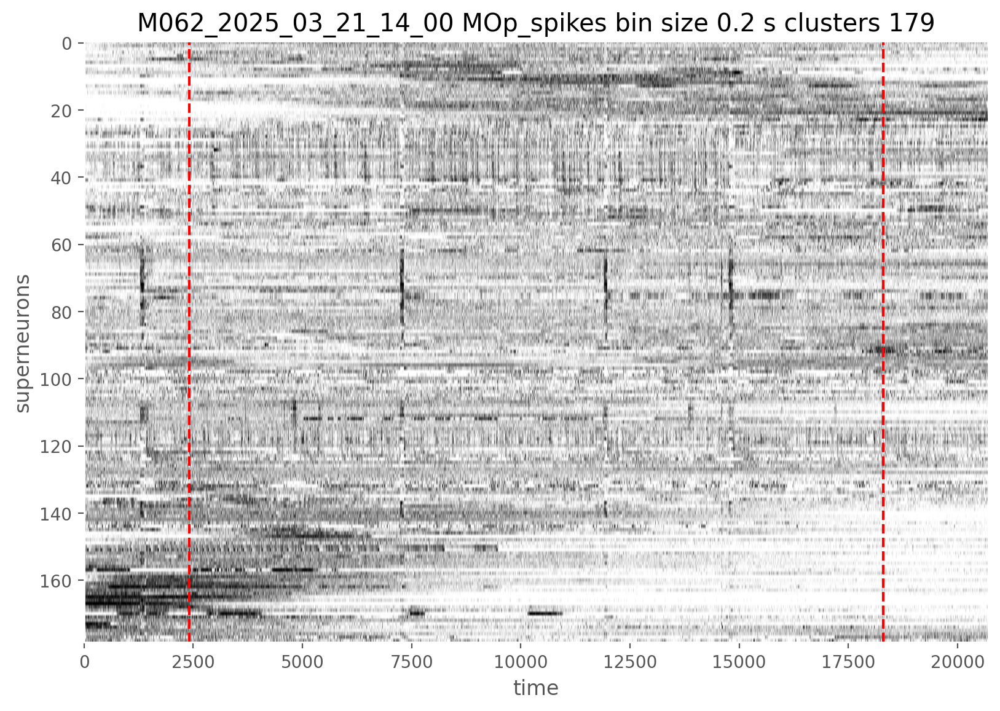

In [50]:
fig = plt.figure(figsize=(12,8), dpi=200)
grid = plt.GridSpec(10, 24, figure=fig, wspace = 0.1, hspace = 0.4)

#
# plot sorted neural activity
ax = plt.subplot(grid[2:, :-5])
ax.imshow(spks[isort, :], cmap="gray_r", vmin=0, vmax=1.2, aspect="auto")
ax.set_xlabel("time")
ax.axvline(pertub_onset, color="red", linestyle="--", label="perturb on")
ax.axvline(perturb_offset, color="red", linestyle="--", label="perturb off")
ax.set_ylabel("superneurons")
ax.set_title(f"{sessions[0]} {field} bin size {bin_size} s clusters {model.n_clusters}" )
ax.grid(False)

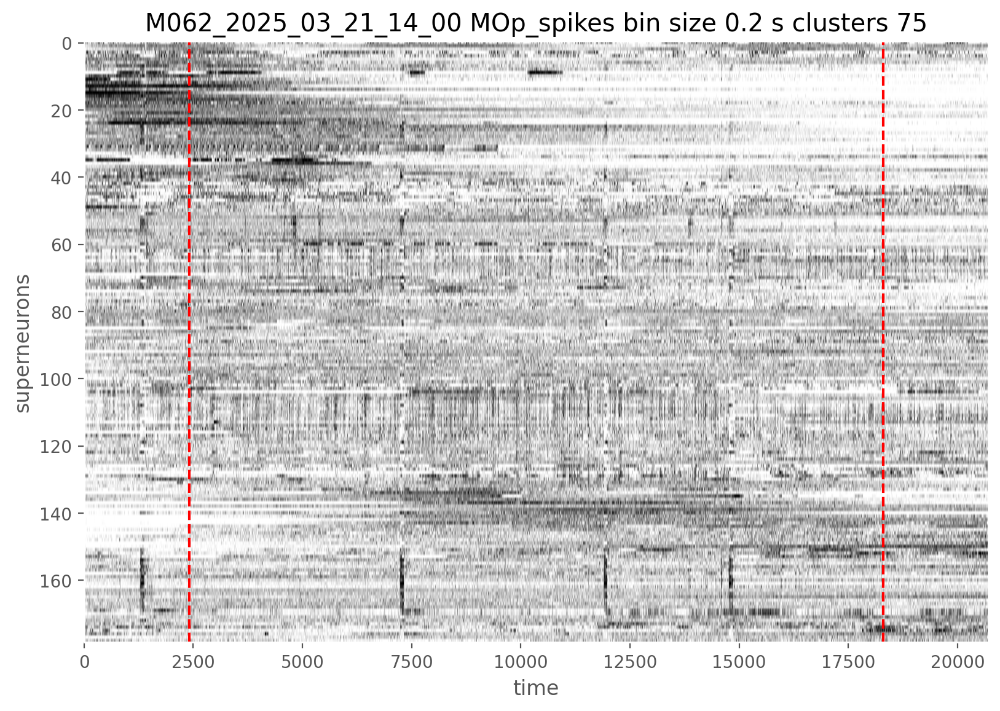

In [59]:
fig = plt.figure(figsize=(12,8), dpi=200)
grid = plt.GridSpec(10, 24, figure=fig, wspace = 0.1, hspace = 0.4)

#
# plot sorted neural activity
ax = plt.subplot(grid[2:, :-5])
ax.imshow(spks[isort, :], cmap="gray_r", vmin=0, vmax=1.2, aspect="auto")
ax.set_xlabel("time")
ax.axvline(pertub_onset, color="red", linestyle="--", label="perturb on")
ax.axvline(perturb_offset, color="red", linestyle="--", label="perturb off")
ax.set_ylabel("superneurons")
ax.set_title(f"{sessions[0]} {field} bin size {bin_size} s clusters {model.n_clusters}" )
ax.grid(False)

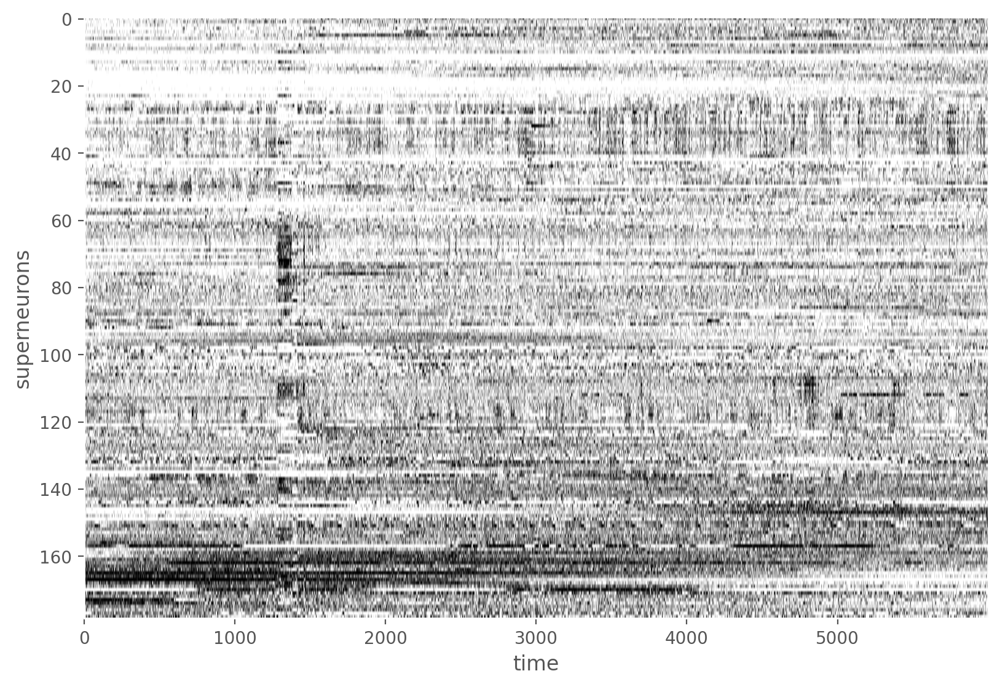

In [47]:
# timepoints to visualize
xmin = 0
xmax = xmin + int(20*60/bin_size) # 10 minutes of recording

# make figure with grid for easy plotting
fig = plt.figure(figsize=(12,8), dpi=200)
grid = plt.GridSpec(10, 24, figure=fig, wspace = 0.1, hspace = 0.4)

#
# plot sorted neural activity
ax = plt.subplot(grid[2:, :-5])
ax.imshow(spks[isort, xmin:xmax], cmap="gray_r", vmin=0, vmax=1.2, aspect="auto")
ax.set_xlabel("time")
ax.set_ylabel("superneurons")
ax.grid(False)


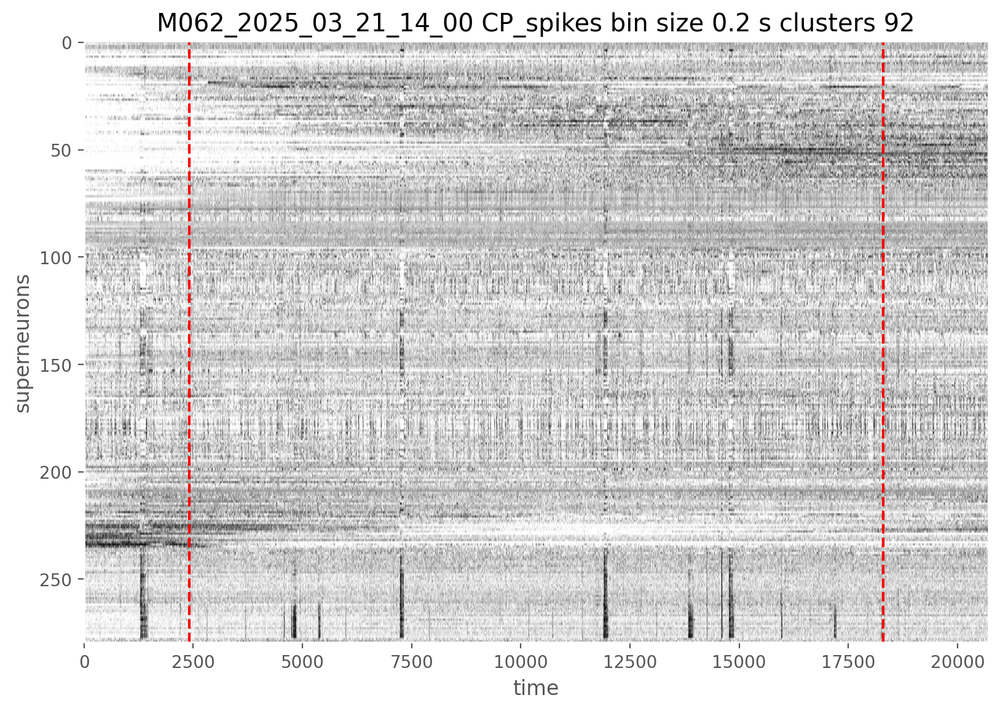

In [55]:
fig = plt.figure(figsize=(12,8), dpi=200)
grid = plt.GridSpec(10, 24, figure=fig, wspace = 0.1, hspace = 0.4)

#
# plot sorted neural activity
ax = plt.subplot(grid[2:, :-5])
ax.imshow(spks[isort, :], cmap="gray_r", vmin=0, vmax=1.2, aspect="auto")
ax.set_xlabel("time")
ax.axvline(pertub_onset, color="red", linestyle="--", label="perturb on")
ax.axvline(perturb_offset, color="red", linestyle="--", label="perturb off")
ax.set_ylabel("superneurons")
ax.set_title(f"{sessions[0]} {field} bin size {bin_size} s clusters {model.n_clusters}" )
ax.grid(False)

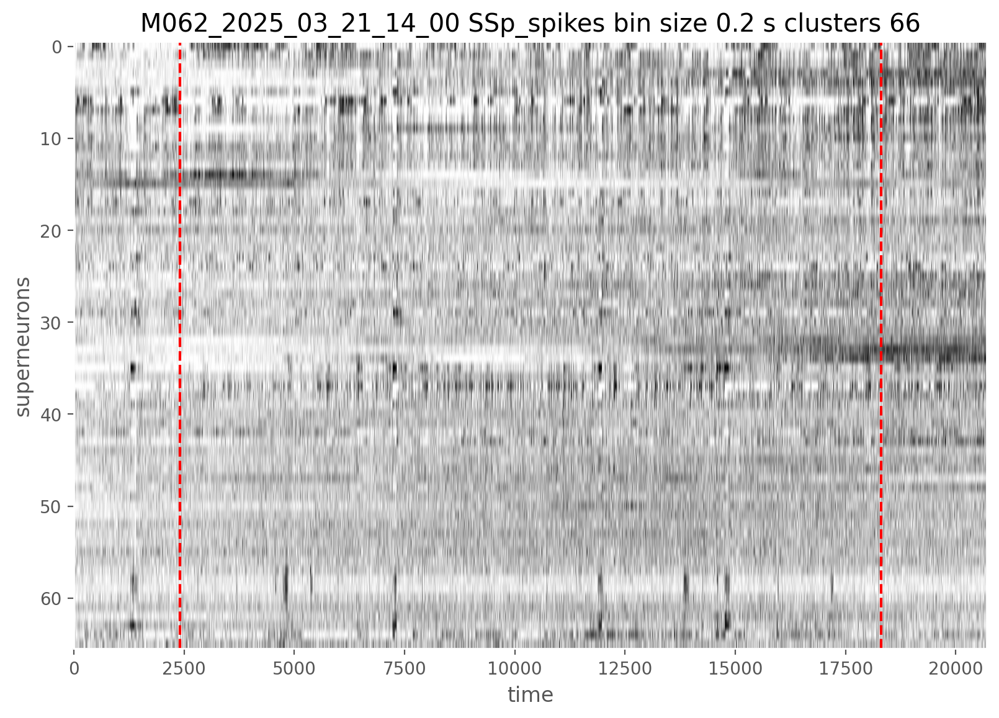

In [63]:
fig = plt.figure(figsize=(12,8), dpi=200)
grid = plt.GridSpec(10, 24, figure=fig, wspace = 0.1, hspace = 0.4)

#
# plot sorted neural activity
ax = plt.subplot(grid[2:, :-5])
ax.imshow(spks[isort, :], cmap="gray_r", vmin=0, vmax=1.2, aspect="auto")
ax.set_xlabel("time")
ax.axvline(pertub_onset, color="red", linestyle="--", label="perturb on")
ax.axvline(perturb_offset, color="red", linestyle="--", label="perturb off")
ax.set_ylabel("superneurons")
ax.set_title(f"{sessions[0]} {field} bin size {bin_size} s clusters {model.n_clusters}" )
ax.grid(False)

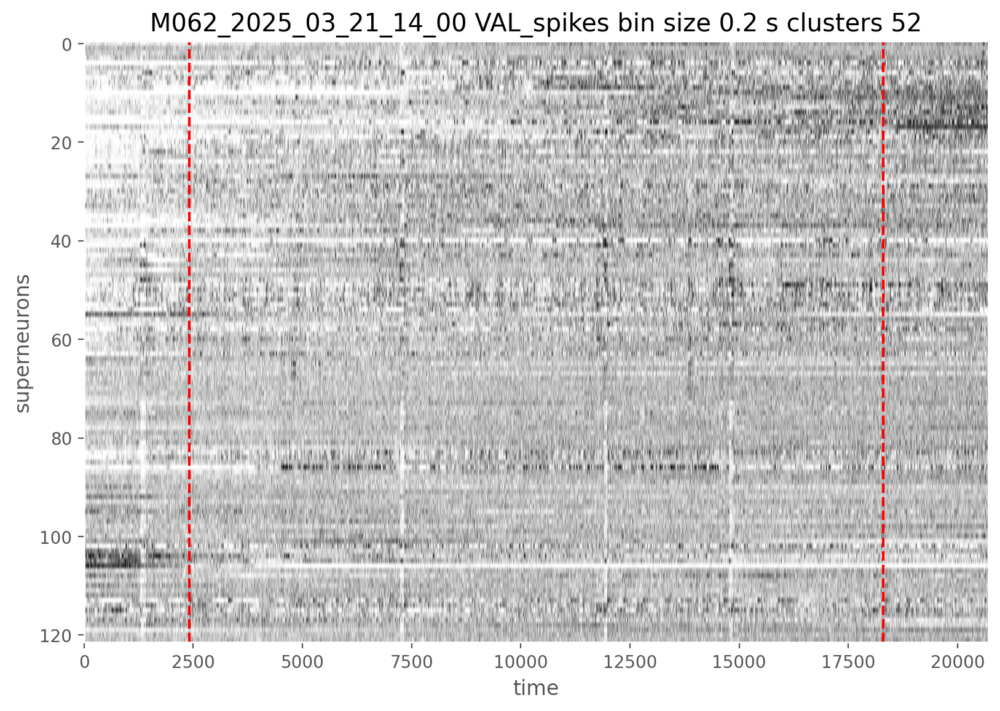

In [67]:
fig = plt.figure(figsize=(12,8), dpi=200)
grid = plt.GridSpec(10, 24, figure=fig, wspace = 0.1, hspace = 0.4)

#
# plot sorted neural activity
ax = plt.subplot(grid[2:, :-5])
ax.imshow(spks[isort, :], cmap="gray_r", vmin=0, vmax=1.2, aspect="auto")
ax.set_xlabel("time")
ax.axvline(pertub_onset, color="red", linestyle="--", label="perturb on")
ax.axvline(perturb_offset, color="red", linestyle="--", label="perturb off")
ax.set_ylabel("superneurons")
ax.set_title(f"{sessions[0]} {field} bin size {bin_size} s clusters {model.n_clusters}" )
ax.grid(False)

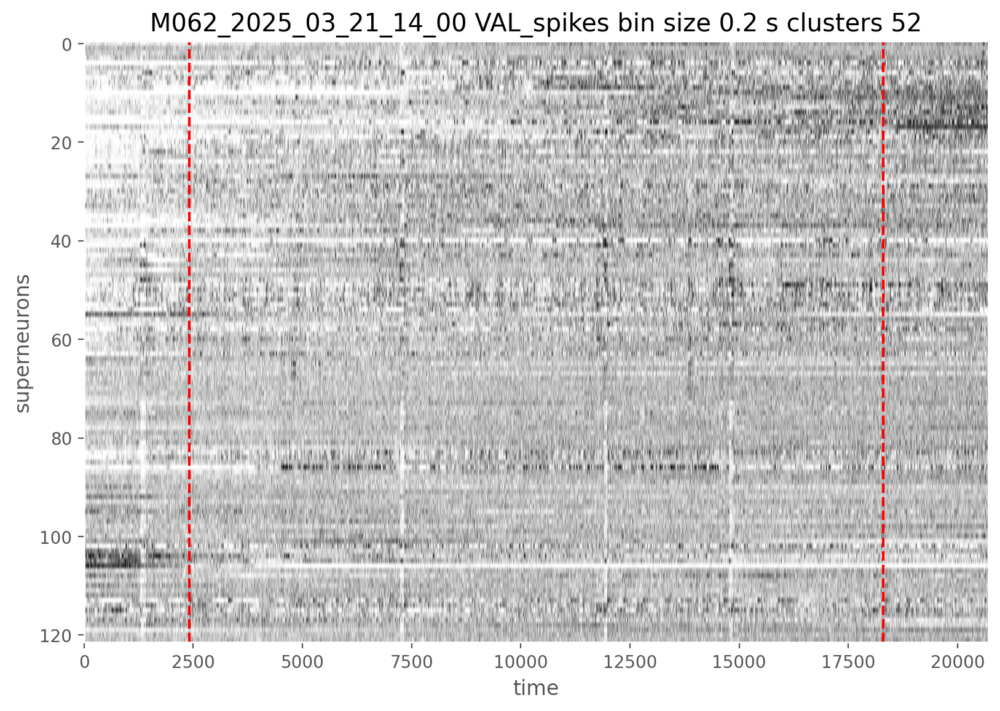

In [73]:
fig = plt.figure(figsize=(12,8), dpi=200)
grid = plt.GridSpec(10, 24, figure=fig, wspace = 0.1, hspace = 0.4)


# plot sorted neural activity
ax = plt.subplot(grid[2:, :-5])
# colour code each neuron by the position of its embedding in the 1D space (i.e. its "superneuron" identity)
ax.imshow(spks[isort, :], cmap="gray_r", vmin=0, vmax=1.2, aspect="auto")
ax.set_xlabel("time")
ax.axvline(pertub_onset, color="red", linestyle="--", label="perturb on")
ax.axvline(perturb_offset, color="red", linestyle="--", label="perturb off")
ax.set_ylabel("superneurons")
ax.set_title(f"{sessions[0]} {field} bin size {bin_size} s clusters {model.n_clusters}" )
ax.grid(False)

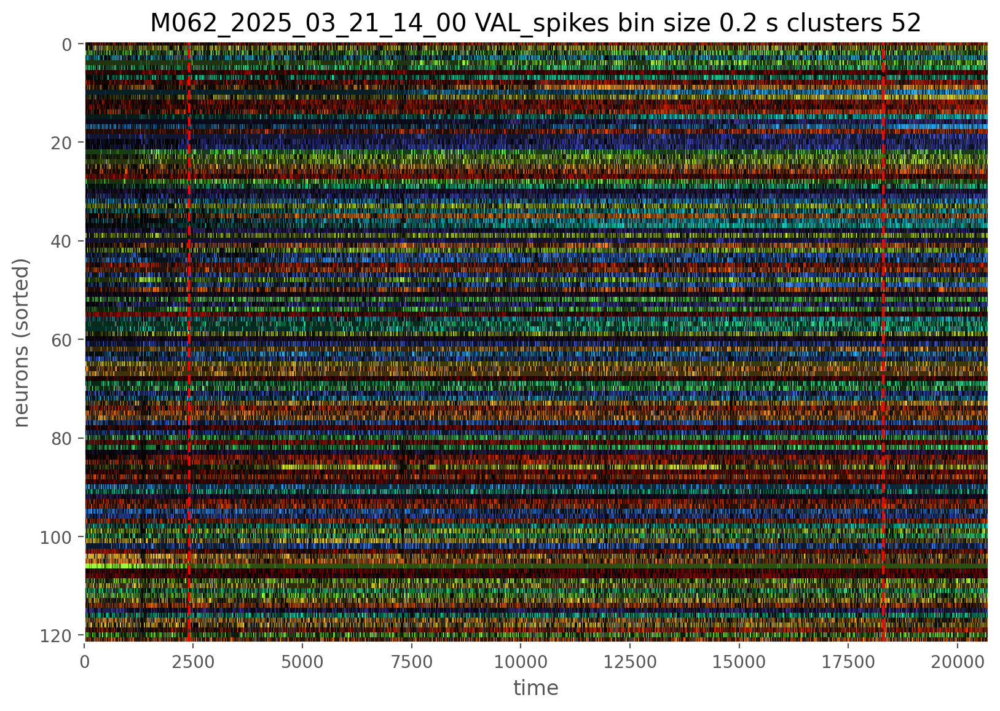

In [75]:
fig = plt.figure(figsize=(12,8), dpi=200)
grid = plt.GridSpec(10, 24, figure=fig, wspace=0.1, hspace=0.4)

ax = plt.subplot(grid[2:, :-5])

# 1) color per neuron from 1D rastermap position
pos = isort
pos_norm = (pos - pos.min()) / (np.ptp(pos) + 1e-8)
neuron_rgb = plt.cm.turbo(pos_norm)[:, :3]   # (n_neurons, 3)

# 2) normalize activity and map to RGB image
sp = spks[isort, :]
lo, hi = np.nanpercentile(sp, 5), np.nanpercentile(sp, 95)
sp_norm = np.clip((sp - lo) / (hi - lo + 1e-8), 0, 1)  # (n_neurons, n_time)

rgb_img = sp_norm[..., None] * neuron_rgb[isort][:, None, :]  # (n_neurons, n_time, 3)

ax.imshow(rgb_img, aspect="auto", interpolation="nearest")
ax.set_xlabel("time")
ax.axvline(pertub_onset, color="red", linestyle="--", label="perturb on")
ax.axvline(perturb_offset, color="red", linestyle="--", label="perturb off")
ax.set_ylabel("neurons (sorted)")
ax.set_title(f"{sessions[0]} {field} bin size {bin_size} s clusters {model.n_clusters}")
ax.grid(False)

In [71]:
model.embedding[:,0]

array([  9.,  62.,  25.,  11.,  22.,  28.,  23.,  61.,  21.,  60.,  59.,
        30.,  35.,   8.,   7.,  90.,  49., 117.,  66.,  34., 106.,  40.,
        83.,  16.,  33.,  92.,  15.,  84.,  38.,  69.,  31.,  32.,  72.,
        95.,  47.,  19.,  26.,  37.,  63.,  41., 102.,  58.,  14.,  45.,
        50.,  29., 114.,  56.,  70.,  71.,  57.,  48.,  54.,   4.,  52.,
        81.,   5.,  80., 116.,  53.,  20., 115.,  51.,  98.,   6.,  68.,
        79.,  89.,  24.,  10., 100.,  82.,   3., 119., 121.,  88., 118.,
        76., 103.,  99., 120.,   2.,   1.,  77.,  17.,   0.,  18.,  12.,
       101.,  39.,  96.,  74.,  44.,  94.,  46.,  36.,  75.,  93.,  42.,
       104.,  86., 105.,  91.,  73.,  97.,  85.,  43.,  27.,  13.,  87.,
       108.,  55.,  78., 107., 111., 109., 112.,  64., 113., 110.,  67.,
        65.])

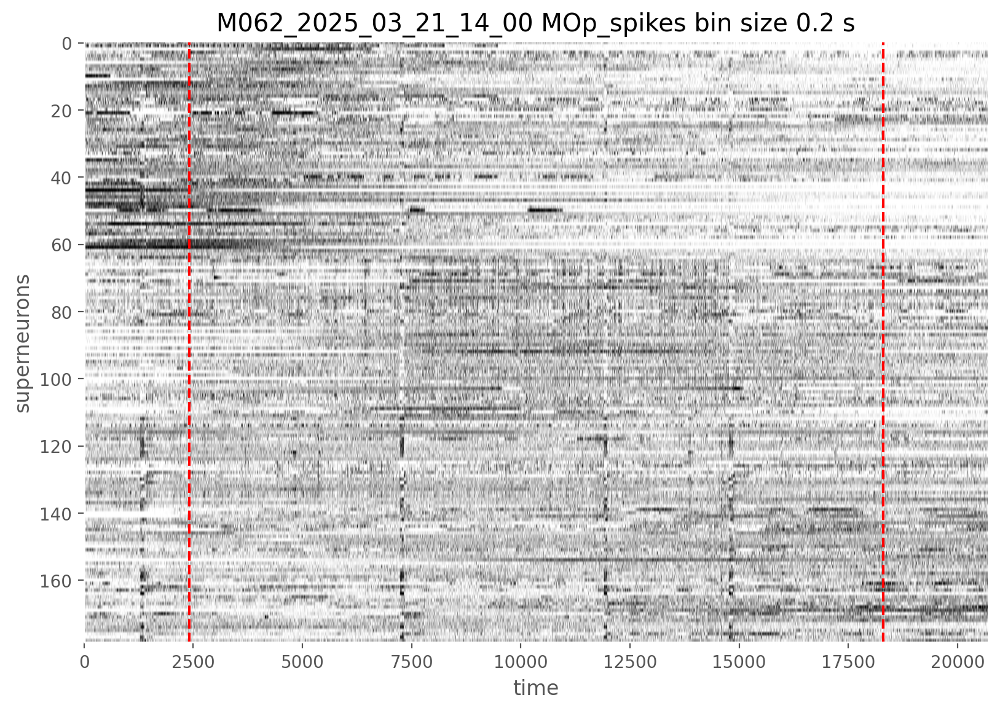

In [ ]:
fig = plt.figure(figsize=(12,8), dpi=200)
grid = plt.GridSpec(10, 24, figure=fig, wspace = 0.1, hspace = 0.4)

#
# plot sorted neural activity
ax = plt.subplot(grid[2:, :-5])
ax.imshow(spks[isort, :], cmap="gray_r", vmin=0, vmax=1.2, aspect="auto")
ax.set_xlabel("time")
ax.axvline(pertub_onset, color="red", linestyle="--", label="perturb on")
ax.axvline(perturb_offset, color="red", linestyle="--", label="perturb off")
ax.set_ylabel("superneurons")
ax.set_title(f"{sessions[0]} {field} bin size {bin_size} s" )
ax.grid(False)

In [40]:
y = model.embedding[:,0]

In [69]:
isort

array([ 85,  82,  81,  72,  53,  56,  64,  14,  13,   0,  69,   3,  87,
       108,  42,  26,  23,  84,  86,  35,  60,   8,   4,   6,  68,   2,
        36, 107,   5,  45,  11,  30,  31,  24,  19,  12,  95,  37,  28,
        89,  21,  39,  98, 106,  92,  43,  94,  34,  51,  16,  44,  62,
        54,  59,  52, 111,  47,  50,  41,  10,   9,   7,   1,  38, 117,
       121,  18, 120,  65,  29,  48,  49,  32, 103,  91,  96,  77,  83,
       112,  66,  57,  55,  71,  22,  27, 105, 100, 109,  75,  67,  15,
       102,  25,  97,  93,  33,  90, 104,  63,  79,  70,  88,  40,  78,
        99, 101,  20, 113, 110, 115, 119, 114, 116, 118,  46,  61,  58,
        17,  76,  73,  80,  74])

In [16]:
Rastermap?

Init signature:
Rastermap(
    n_clusters=100,
    n_PCs=200,
    time_lag_window=0.0,
    locality=0.0,
    grid_upsample=10,
    time_bin=0,
    normalize=True,
    mean_time=True,
    n_splits=0,
    run_scaled_kmeans=True,
    verbose=True,
    verbose_sorting=False,
    keep_norm_X=True,
    bin_size=0,
    symmetric=False,
    random_state=0,
    sticky=True,
    nc_splits=None,
    smoothness=1,
)
Docstring:     
Rastermap embedding algorithm
Rastermap takes the n_PCs (200 default) of the data, and embeds them into
n_clusters clusters. It then sorts the clusters and upsamples to a grid with 
grid_upsample * n_clusters nodes. Each data sample is assigned to a node. 
The assignment of the samples to nodes is attribute `embedding`, and the sorting 
of the nodes is `isort`.

Parameters in order of importance

Parameters
-----------
n_clusters : int, optional (default: 100)
    number of clusters created from data before upsampling and creating embedding
    (any number above 150 wil

In [32]:
Rastermap.fit?

Signature:
Rastermap.fit(
    self,
    data=None,
    Usv=None,
    Vsv=None,
    U_nodes=None,
    itrain=None,
    compute_X_embedding=True,
    BBt=None,
)
Docstring:
sorts data or singular value decomposition of data by first axis

can use full data matrix, or use singular value decomposition, to reduce RAM 
requirements, it is recommended to use float32. see Rastermap class for 
parameter information (`Rastermap?`)

example usage:
```
import numpy as np
import matplotlib.pyplot as plt
from rastermap import Rastermap, utils
from scipy.stats import zscore

# spks is neurons by time
spks = np.load("spks.npy").astype("float32")
spks = zscore(spks, axis=1)

# fit rastermap
model = Rastermap(n_PCs=200, n_clusters=100, 
                locality=0.75, time_lag_window=5).fit(spks)
y = model.embedding # neurons x 1
isort = model.isort
X_embedding = model.X_embedding # neurons by time

# plot
fig = plt.figure(figsize=(12,5))
ax = fig.add_subplot(111)
ax.imshow(X_embedding, vmin=0, vmax=1.5,

In [ ]:
session = sessions[0]
for area in ["MOp","SSp","CP","VAL"]:
    field = f"{area}_spikes"
    path = f"/data/rastermap-data/{session}_{field}.npy"
    data = np.concatenate(df[field].values, axis = 0).astype(np.float32, copy=False)
    # save data as npy file
    np.save(path, data.T)